<a href="https://colab.research.google.com/github/HSE-LAMBDA/MLDM-2022/blob/master/12-architectures/TL_AE_HW.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [133]:
%matplotlib inline
import time
import numpy as np
import pandas as pd
import datetime as dt
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1 import ImageGrid
from os import listdir, makedirs, getcwd, remove
from os.path import isfile, join, abspath, exists, isdir, expanduser
from PIL import Image
import torch
from torch.optim import lr_scheduler, SGD
from torch.autograd import Variable
from torch.utils.data import Dataset, DataLoader
import torchvision
from torchvision import transforms, datasets, models
import torch.nn as nn
from torch.nn.functional import cross_entropy


In [62]:
np.random.seed(1337)

# Dog Breed Identification




Download the dataset from [Dog Breed Identification
 Competition](https://www.kaggle.com/competitions/dog-breed-identification/data)

In [63]:
!mkdir ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

mkdir: cannot create directory ‘/root/.kaggle’: File exists
cp: cannot stat 'kaggle.json': No such file or directory
chmod: cannot access '/root/.kaggle/kaggle.json': No such file or directory


In [64]:
!gdown 1gnWiIwfHGjU4HFElAcrD1pOGP1st8tQI

Downloading...
From: https://drive.google.com/uc?id=1gnWiIwfHGjU4HFElAcrD1pOGP1st8tQI
To: /content/dog-breed-identification.zip
100% 724M/724M [00:08<00:00, 83.8MB/s]


In [65]:
!unzip dog-breed-identification.zip -d data


Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: data/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: data/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: data/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: data/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: data/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: data/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: data/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: data/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: data/train/83fad0718581a696132c96c166472627.jpg  
  inflating: data/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: data/train/8403d8936430c2f05ab7d74d23c2c0cb.jpg  
  inflating: data/train/8406d837b2d7fac1c3cd621abb4c4f9e.jpg  
  inflating: data/train/840b67d26e5e43f8eb6430f62d4ba1ac.jpg  
  inflating: data/train/840db91ba4600148f3dcb06ec419b421.jpg  
  inflating: data/train/840dbad5a691c22611d85b2488

Let's use 64 most frequent breeds to simplify the task.

In [137]:
INPUT_SIZE = 224
NUM_CLASSES = 64
data_dir = '/content/data/'
labels = pd.read_csv(join(data_dir, 'labels.csv'))
sample_submission = pd.read_csv(join(data_dir, 'sample_submission.csv'))
print(len(listdir(join(data_dir, 'train'))), len(labels))
print(len(listdir(join(data_dir, 'test'))), len(sample_submission))

10222 10222
10357 10357


In [138]:
selected_breed_list = list(labels.groupby('breed').count().sort_values(by='id', ascending=False).head(NUM_CLASSES).index)
labels = labels[labels['breed'].isin(selected_breed_list)]
labels['target'] = 1
labels['rank'] = labels.groupby('breed').rank()['id']
labels_pivot = labels.pivot('id', 'breed', 'target').reset_index().fillna(0)

train = labels_pivot.sample(frac=0.8)
valid = labels_pivot[~labels_pivot['id'].isin(train['id'])]
print(train.shape, valid.shape)

(4838, 65) (1210, 65)


<ipython-input-138-0037ea12ab23>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  labels['target'] = 1
<ipython-input-138-0037ea12ab23>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  labels['rank'] = labels.groupby('breed').rank()['id']
<ipython-input-138-0037ea12ab23>:5: FutureWarning: In a future version of pandas all arguments of DataFrame.pivot will be keyword-only.
  labels_pivot = labels.pivot('id', 'breed', 'target').reset_index().fillna(0)


Custom dataset is going to be useful for our needs.

In [139]:
class DogsDataset(Dataset):
    def __init__(self, labels, root_dir, subset=False, transform=None):
        self.labels = labels
        self.root_dir = root_dir
        self.transform = transform

    def __len__(self):
        return len(self.labels)

    def __getitem__(self, idx):
        img_name = '{}.jpg'.format(self.labels.iloc[idx, 0])
        fullname = join(self.root_dir, img_name)
        image = Image.open(fullname)
        labels = self.labels.iloc[idx, 1:].to_numpy().astype('float')
        labels = np.argmax(labels)
        if self.transform:
            image = self.transform(image)
        return [image, labels]

In [140]:
normalize = transforms.Normalize(
   mean=[0.485, 0.456, 0.406],
   std=[0.229, 0.224, 0.225]
)
ds_trans = transforms.Compose([transforms.Resize(224),
                               transforms.CenterCrop(224),
                               transforms.ToTensor(),
                               normalize])
train_ds = DogsDataset(train, data_dir + 'train/', transform=ds_trans)
valid_ds = DogsDataset(valid, data_dir + 'train/', transform=ds_trans)

train_dl = DataLoader(train_ds, batch_size=4, shuffle=True, num_workers=4)
valid_dl = DataLoader(valid_ds, batch_size=4, shuffle=True, num_workers=4)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [141]:
def imshow(axis, inp):
    """Denormalize and show"""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    axis.imshow(inp)

torch.Size([4, 3, 224, 224]) torch.Size([4])


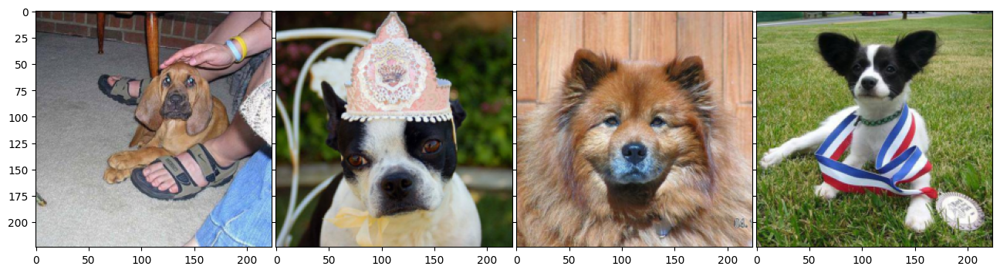

In [142]:
img, label = next(iter(train_dl))
print(img.size(), label.size())
fig = plt.figure(1, figsize=(16, 4))
grid = ImageGrid(fig, 111, nrows_ncols=(1, 4), axes_pad=0.05)
for i in range(img.size()[0]):
    ax = grid[i]
    imshow(ax, img[i])

# Task 1: Transfer Learning (2 points)



Pick up some pretrained model, e.g. resnet 50 and tune it for our needs.

In [144]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
resnet = models.resnet50(pretrained=True)
inputs, labels = next(iter(train_dl))
print(inputs.shape)
resnet = resnet.to(device)
inputs, labels = inputs.to(device), labels.to(device)
outputs = resnet(inputs)
outputs.size()

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


torch.Size([4, 3, 224, 224])


torch.Size([4, 1000])

This models provides us with 1000 values, representing the classes which ResNet was trained on.

Replace last layer with one that predicts the 64 classes.
The network weights should be fixed expected for the last layer that is trained.

In [152]:
def train_model(dataloders,
                model,
                criterion,
                optimizer,
                scheduler,
                num_epochs=1):
    model.train()
    for i in range(num_epochs):

      for i, (x, _) in enumerate(dataloders['train']):

          # zero the gradients
          optimizer.zero_grad()

          # forward propagation
          x_ = model(x.to(device))

          # compute the loss
          loss = criterion(x_, _.to(device))
          # backward propagation
          loss.backward()

          # update the weights
          optimizer.step()
    return model

In [153]:

import torch.nn as nn
import torch.optim as optim
from torch.nn.functional import cross_entropy
from torch.optim import lr_scheduler, SGD
resnet = models.resnet50(pretrained=True)
# freeze all model parameters
for param in resnet.parameters():
    param.requires_grad = False

lr = 1e-3
resnet.fc = nn.Linear(resnet.fc.in_features, 64)
resnet = resnet.cuda()
resnet = resnet.to(device)
criterion = cross_entropy
optimizer = SGD(resnet.parameters(), lr = lr)
scheduler = lr_scheduler.StepLR(optimizer, step_size = 2, gamma = 0.9)
dloaders = {'train':train_dl, 'valid':valid_dl}

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [154]:
model = train_model(dloaders, resnet, criterion, optimizer, scheduler)

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [155]:
def visualize_model(dataloders, model, num_images=16):
    cnt = 0
    fig = plt.figure(1, figsize=(16, 16))
    grid = ImageGrid(fig, 111, nrows_ncols=(4, 4), axes_pad=0.05)
    for i, (inputs, labels) in enumerate(dataloders['valid']):
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = model(inputs)
        _, preds = torch.max(outputs.data, 1)

        for j in range(inputs.size()[0]):
            ax = grid[cnt]
            imshow(ax, inputs.cpu().data[j])
            ax.text(10, 210, ' Prediction: {}\n Real Label: {}'.format(preds[j], labels.data[j]),
                    color='k', backgroundcolor='w', alpha=0.8)
            cnt += 1
            if cnt == num_images:
                return

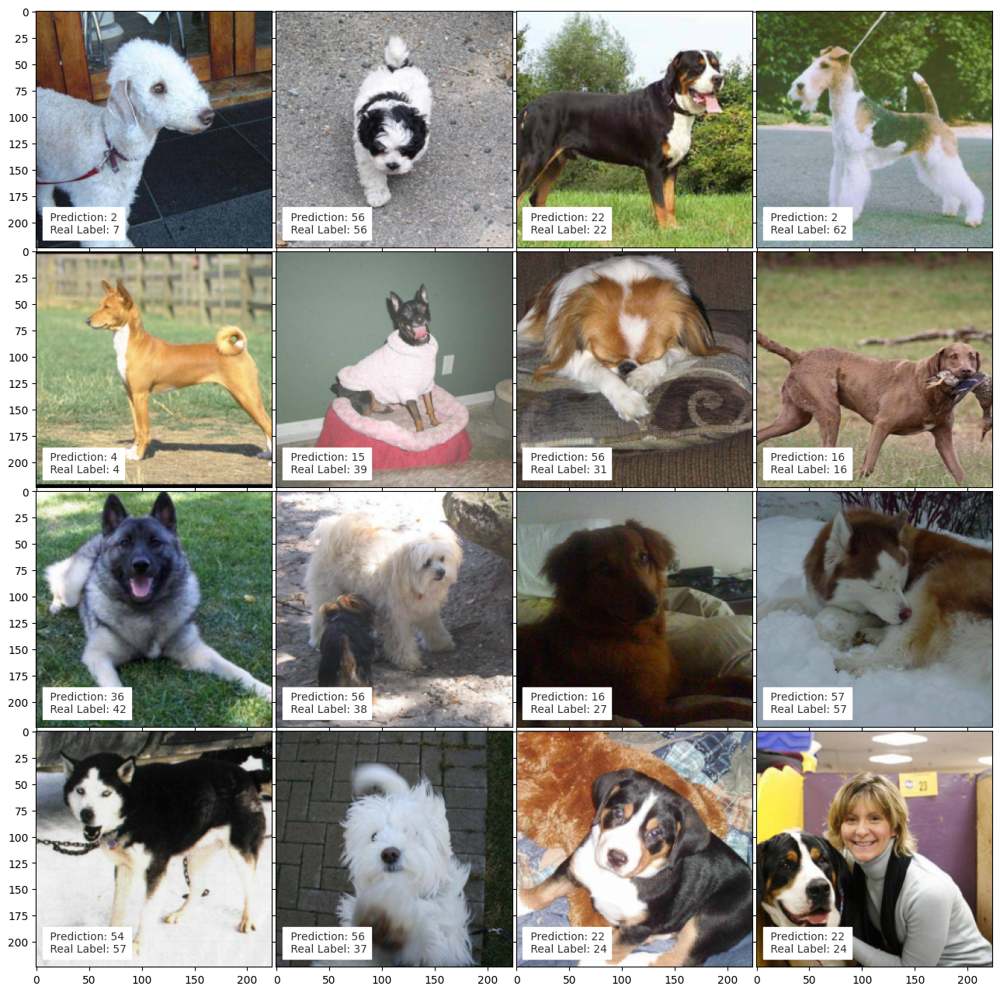

In [156]:
visualize_model(dloaders, model)

In [157]:

right, total = 0, 0
for x, _ in valid_dl:
    x_ = model(x.to(device))

    right += (x_.argmax(axis=1)==_.to(device)).sum()
    total += len(_)
print(f'test accuracy with 1 epoch is {right/total}')

test accuracy with 1 epoch is 0.23057851195335388


# Task 2: Low-dimensional dogs (4 points)
Train a **Conditional CNN Autoencoder** that takes class labels into account. Show examples of interpolations between instances of different classes in a latent space and related representation of images in original space (just the same way we did it during practical session).

In [162]:
class CNNAutoEncoder(nn.Module):
    def __init__(self, in_ch, hidden_ch, kernel_size = 5, activation = nn.ReLU6()):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(in_ch, hidden_ch, kernel_size = kernel_size),
            activation
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(hidden_ch, in_ch, kernel_size = kernel_size),
            activation
        )

    def forward(self, x):
        h = self.encoder(x)
        x_ = self.decoder(h)
        return x_

In [163]:
def train_epoch(net, loader, optimizer, criterion, device):
    net.train()
    loss_avg = 0
    for x, _ in loader:
        # construct a batch
        x = x.to(device)

        # zero the gradients
        optimizer.zero_grad()

        # forward propagation
        x_ = net(x)

        # compute the loss
        loss = criterion(x_, x)

        # backward propagation
        loss.backward()

        # update the weights
        optimizer.step()

        loss_avg += loss.item()
    loss_avg = loss_avg / len(loader)
    return loss_avg

def test_epoch(net, loader, criterion, device):
    net.eval()
    loss_avg = 0
    for x, _ in loader:
        # construct a batch
        x = x.to(device)

        # forward propagation
        x_ = net(x)

        # compute the loss
        loss = criterion(x_, x)

        loss_avg += loss.item()
    loss_avg = loss_avg / len(loader)
    return loss_avg

def train(net, train_loader, test_loader, optimizer, epochs, criterion, device):
    train_losses = np.zeros((epochs))
    test_losses = np.zeros((epochs))
    for epoch in range(epochs):
        train_losses[epoch] = train_epoch(net, train_loader, optimizer, criterion, device)
        test_losses[epoch] = test_epoch(net, test_loader, criterion, device)
        print("Epoch %d/%d: Train loss = %.4f - Test loss = %.4f"
              % (epoch + 1, epochs, train_losses[epoch], test_losses[epoch]))

    return train_losses, test_losses

In [164]:
inner_dim = 10
model = CNNAutoEncoder(3, inner_dim, 10, nn.Sigmoid())
model.to(device)
criterion = nn.MSELoss()
optimizer = SGD(model.parameters(), lr = 0.001)

In [165]:
train_loss, test_loss = train(model, train_dl, valid_dl,
                              optimizer, 1, criterion, device)

Epoch 1/1: Train loss = 0.9588 - Test loss = 0.8403


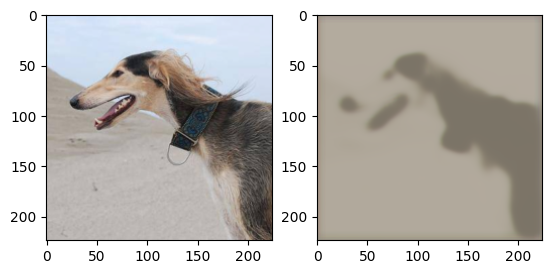

In [166]:
# propagate a sample
model.eval()
x = valid_dl.dataset[7][0].to(device)
x_ = model(x)

# show the result
fig, ax = plt.subplots(1, 2)
imshow(ax[0], x.cpu())
imshow(ax[1], x_.detach().cpu())

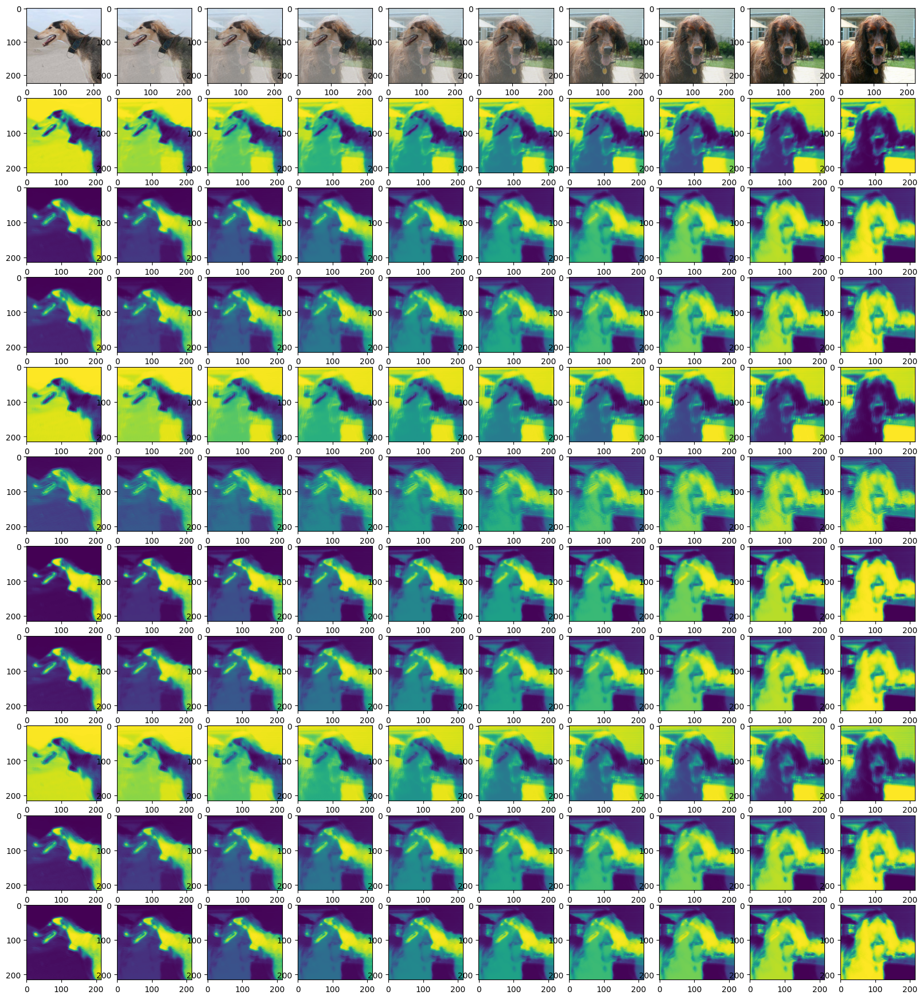

In [167]:
def my_imshow(axis, inp):
    """Denormalize and show"""
    inp = inp.numpy()[0]
    axis.imshow(inp)
x = valid_dl.dataset[7][0].to(device)
y = valid_dl.dataset[12][0].to(device)

x_, y_ = model.encoder(x), model.encoder(y)
xdraw = x.detach().cpu()
ydraw = y.detach().cpu()

x_draw = x_.detach().cpu()
y_draw = y_.detach().cpu()

fig, ax = plt.subplots(1+inner_dim, 10, figsize = (20, 22))
for k in range(10):
    imshow(ax[0, k], xdraw*(1-k/9)+ydraw*k/9)
    for j in range(inner_dim):
        ax[j+1, k].imshow(x_draw[j]*(1-k/9)+y_draw[j]*k/9)

Each layer is outlining some features of the image. Some layers (e.g. 3 and 4) are doing practically the same thing, hence, they can be reduced

# Task 3: Boosting the quality (2 points)

The general objective here is to boost the quality you got on the first step.
You can tune one/two more models from `torchvision` or `timm` and stack their predictions **OR** create your own CNN and use the encoder of your Autoencoder from 2nd task **OR** both.

Don't forget to compare your models properly, e.g. it's not enough to run them for only a few epochs.

In [168]:
class MyMIX(nn.Module):
    def __init__(self, activation = nn.ReLU6()):
        super(MyMIX, self).__init__()
        self.activation = activation
        self.model1 = torch.hub.load('pytorch/vision:v0.10.0', 'squeezenet1_0', pretrained=True)
        self.model2 = torchvision.models.resnet50(pretrained = True)

        self.d1 = nn.Linear(1000, 100)
        self.d2 = nn.Linear(100, 64)


    def forward(self, x):
        x1 = self.model1(x)
        x2 = self.model2(x)

        x_sum = self.activation(self.d1((x1+x2)/2))
        x_sum = self.activation(self.d2(x_sum))
        return x_sum

model = MyMIX()
model.to(device)
criterion = nn.CrossEntropyLoss()
optimizer = SGD(model.parameters(), lr = 1e-3)

num_epochs = 5
for m in [model]:
    for ep in range(num_epochs):
        loss_avg = 0
        for i, (x, _) in enumerate(train_dl):
            # construct a batch
            x = x.to(device)
            x = x.to(torch.float32)
            _ = _.to(torch.float32)
            # zero the gradients
            optimizer.zero_grad()

            # forward propagation
            x_ = m(x.to(device))

            # compute the loss
            loss = criterion(x_, _.long().to(device))

            # backward propagation
            loss.backward()

            # update the weights
            optimizer.step()

            loss_avg += loss.item()
        loss_avg = loss_avg / len(train_dl)
        print(loss_avg)

Using cache found in /root/.cache/torch/hub/pytorch_vision_v0.10.0
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=SqueezeNet1_0_Weights.IMAGENET1K_V1`. You can also use `weights=SqueezeNet1_0_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


3.8721274411382756
3.0493944543944904
2.511488969956548
2.201986660272622
1.9903051512546777


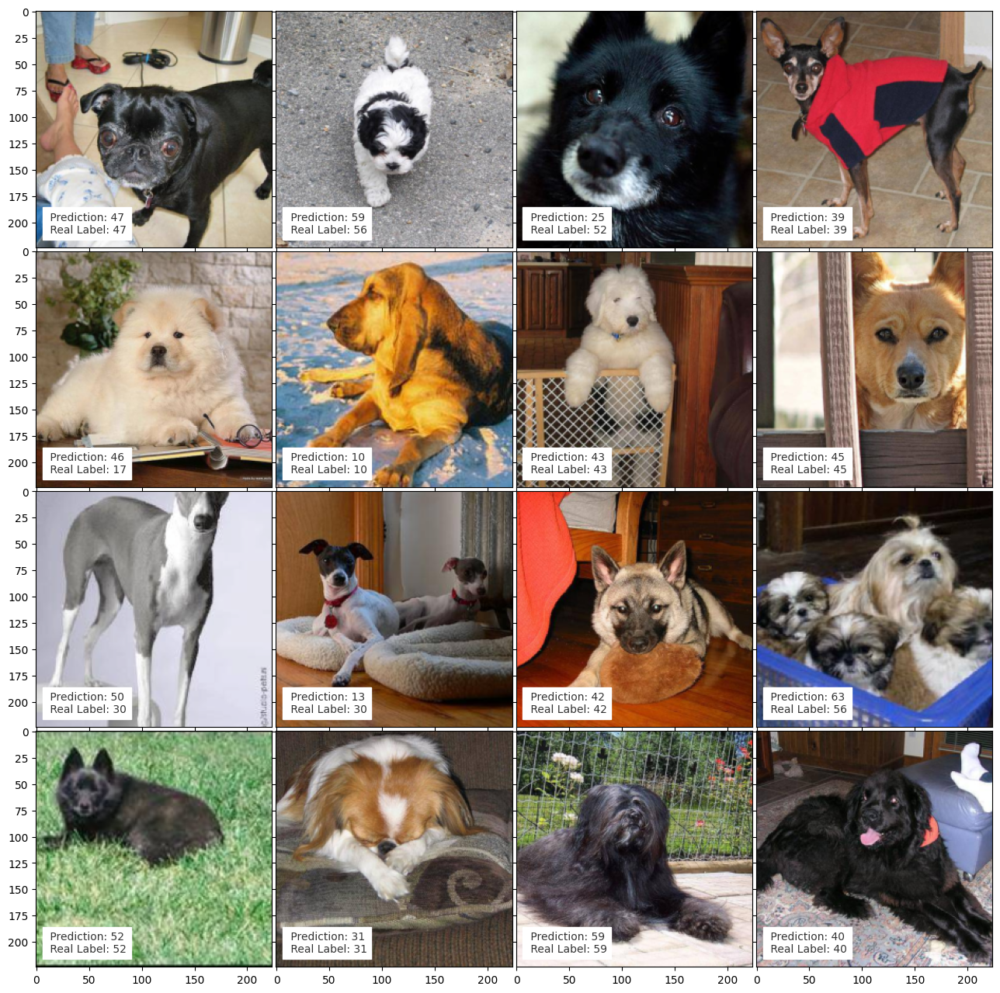

In [169]:
visualize_model(dloaders, model)

In [170]:
right, total = 0, 0
for x, _ in valid_dl:
    x_ = model(x.to(device))

    right += (x_.argmax(axis=1)==_.to(device)).sum()
    total += len(_)
print(f'5 epochs: test accuracy = {right/total}')

5 epochs: test accuracy = 0.5669421553611755


Write a comment on model comparison, things and ideas that helped boost the quality, and anything else you would like to share.

The increasing in epochs allowed to increase the accuracy 2 times. That is a perfect result.